###Problem Statement:
Flight ticket prices can be something hard to guess, today we might see a price, check out the price of the same flight tomorrow, it will be a different story. We might have often heard travellers saying that flight ticket prices are so unpredictable. Here you will be provided with prices of flight tickets for various airlines between the months of March and June of 2019 and between various cities.
### Implimentations
Build a machine learning model to predict the price of the flight ticket. 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

Imported Basic Library

In [2]:
df_train_flight=pd.read_excel("/content/drive/MyDrive/Colab Notebooks/Data_Train.xlsx",parse_dates=["Date_of_Journey","Dep_Time","Arrival_Time"])
df_test_flight=pd.read_excel("/content/drive/MyDrive/Colab Notebooks/Test_set.xlsx",parse_dates=["Date_of_Journey","Dep_Time","Arrival_Time"])
df_train_flight["dataset"]="train"
df_test_flight["dataset"]="test"

Read train and test dtatset and add to dataframe of columans name "dataset" to seprate train and test data.

In [3]:
df_flight=pd.concat([df_train_flight,df_test_flight],ignore_index=True)
df_flight

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,dataset
0,IndiGo,2019-03-24,Banglore,New Delhi,BLR → DEL,2021-06-17 22:20:00,2021-03-22 01:10:00,2h 50m,non-stop,No info,3897.0,train
1,Air India,2019-01-05,Kolkata,Banglore,CCU → IXR → BBI → BLR,2021-06-17 05:50:00,2021-06-17 13:15:00,7h 25m,2 stops,No info,7662.0,train
2,Jet Airways,2019-09-06,Delhi,Cochin,DEL → LKO → BOM → COK,2021-06-17 09:25:00,2021-06-10 04:25:00,19h,2 stops,No info,13882.0,train
3,IndiGo,2019-12-05,Kolkata,Banglore,CCU → NAG → BLR,2021-06-17 18:05:00,2021-06-17 23:30:00,5h 25m,1 stop,No info,6218.0,train
4,IndiGo,2019-01-03,Banglore,New Delhi,BLR → NAG → DEL,2021-06-17 16:50:00,2021-06-17 21:35:00,4h 45m,1 stop,No info,13302.0,train
...,...,...,...,...,...,...,...,...,...,...,...,...
13349,Air India,2019-06-06,Kolkata,Banglore,CCU → DEL → BLR,2021-06-17 20:30:00,2021-06-07 20:25:00,23h 55m,1 stop,No info,NaN,test
13350,IndiGo,2019-03-27,Kolkata,Banglore,CCU → BLR,2021-06-17 14:20:00,2021-06-17 16:55:00,2h 35m,non-stop,No info,NaN,test
13351,Jet Airways,2019-06-03,Delhi,Cochin,DEL → BOM → COK,2021-06-17 21:50:00,2021-03-07 04:25:00,6h 35m,1 stop,No info,NaN,test
13352,Air India,2019-06-03,Delhi,Cochin,DEL → BOM → COK,2021-06-17 04:00:00,2021-06-17 19:15:00,15h 15m,1 stop,No info,NaN,test


Read Dataset and displayed whole data found there are 13354 rows × 12 columns.

In [4]:
#Lets chcek the null values in the dataset
df_flight.isnull().sum()

Airline               0
Date_of_Journey       0
Source                0
Destination           0
Route                 1
Dep_Time              0
Arrival_Time          0
Duration              0
Total_Stops           1
Additional_Info       0
Price              2671
dataset               0
dtype: int64

There are no null values only Price has 2671 null values which are part of test dataset so no need to worry

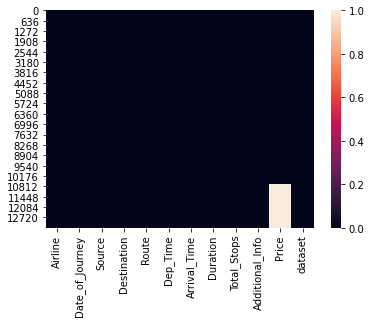

In [5]:
sns.heatmap(df_flight.isnull())

Graphysical Representations of null value

In [6]:
#this is the mean of whole df_flight which includes train and test
df_flight.loc[df_flight["Airline"]=="IndiGo",["Price"]].mean()
#this is the mean of only train part of df_flight
df_flight.loc[(df_flight["Airline"]=="IndiGo")&(df_flight["dataset"]=="train"),["Price"]].mean()

Price    5673.682903
dtype: float64

In [7]:
#Lets chcek the value counts of each column of object datatype
for col in df_flight.columns:
    if df_flight[col].dtype=="object":
        print(df_flight[col].value_counts())
        print()

Jet Airways                          4746
IndiGo                               2564
Air India                            2192
Multiple carriers                    1543
SpiceJet                             1026
Vistara                               608
Air Asia                              405
GoAir                                 240
Multiple carriers Premium economy      16
Jet Airways Business                    8
Vistara Premium economy                 5
Trujet                                  1
Name: Airline, dtype: int64

Delhi       5682
Kolkata     3581
Banglore    2752
Mumbai       883
Chennai      456
Name: Source, dtype: int64

Cochin       5682
Banglore     3581
Delhi        1582
New Delhi    1170
Hyderabad     883
Kolkata       456
Name: Destination, dtype: int64

DEL → BOM → COK                3000
BLR → DEL                      1941
CCU → BOM → BLR                1232
CCU → BLR                       896
BOM → HYD                       785
                               ..

In [8]:
#need to exract features from dep_time
import numpy as np
df_flight["time_of_day"]=np.where((df_flight["Dep_Time"].dt.hour>=0)&(df_flight["Dep_Time"].dt.hour<=2),"Late Night",np.where((df_flight["Dep_Time"].dt.hour>=3)&(df_flight["Dep_Time"].dt.hour<=7),"Early Morning",np.where((df_flight["Dep_Time"].dt.hour>=8)&(df_flight["Dep_Time"].dt.hour<=11),"Morning",np.where((df_flight["Dep_Time"].dt.hour>=12)&(df_flight["Dep_Time"].dt.hour<=16),"Afternoon",np.where((df_flight["Dep_Time"].dt.hour>=17)&(df_flight["Dep_Time"].dt.hour<=19),"Evening","Night")))))

In [9]:
x=(df_flight["Arrival_Time"]-df_flight["Dep_Time"])
duration_list=list()
for i in range(len(x)):
    dur=x.iloc[i].seconds/3600
    duration_list.append(dur)
df_flight["Duration"]=duration_list
df_flight

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,dataset,time_of_day
0,IndiGo,2019-03-24,Banglore,New Delhi,BLR → DEL,2021-06-17 22:20:00,2021-03-22 01:10:00,2.833333,non-stop,No info,3897.0,train,Night
1,Air India,2019-01-05,Kolkata,Banglore,CCU → IXR → BBI → BLR,2021-06-17 05:50:00,2021-06-17 13:15:00,7.416667,2 stops,No info,7662.0,train,Early Morning
2,Jet Airways,2019-09-06,Delhi,Cochin,DEL → LKO → BOM → COK,2021-06-17 09:25:00,2021-06-10 04:25:00,19.000000,2 stops,No info,13882.0,train,Morning
3,IndiGo,2019-12-05,Kolkata,Banglore,CCU → NAG → BLR,2021-06-17 18:05:00,2021-06-17 23:30:00,5.416667,1 stop,No info,6218.0,train,Evening
4,IndiGo,2019-01-03,Banglore,New Delhi,BLR → NAG → DEL,2021-06-17 16:50:00,2021-06-17 21:35:00,4.750000,1 stop,No info,13302.0,train,Afternoon
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13349,Air India,2019-06-06,Kolkata,Banglore,CCU → DEL → BLR,2021-06-17 20:30:00,2021-06-07 20:25:00,23.916667,1 stop,No info,NaN,test,Night
13350,IndiGo,2019-03-27,Kolkata,Banglore,CCU → BLR,2021-06-17 14:20:00,2021-06-17 16:55:00,2.583333,non-stop,No info,NaN,test,Afternoon
13351,Jet Airways,2019-06-03,Delhi,Cochin,DEL → BOM → COK,2021-06-17 21:50:00,2021-03-07 04:25:00,6.583333,1 stop,No info,NaN,test,Night
13352,Air India,2019-06-03,Delhi,Cochin,DEL → BOM → COK,2021-06-17 04:00:00,2021-06-17 19:15:00,15.250000,1 stop,No info,NaN,test,Early Morning



From description we can see that Date_of_Journey is a object data type,\ Therefore, we have to convert this datatype into timestamp so as to use this column properly for prediction

For this we require pandas to_datetime to convert object data type to datetime dtype.

**.dt.day method will extract only day of that date**\ **.dt.month method will extract only month of that date**



In [10]:
df_flight["Journey_month"] = pd.to_datetime(df_flight["Date_of_Journey"], format = "%d/%m/%Y").dt.month
df_flight["Journey_day"] = pd.to_datetime(df_flight.Date_of_Journey, format="%d/%m/%Y").dt.day
df_flight.drop(["Date_of_Journey"], axis = 1, inplace = True)
df_flight.head(5)

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,dataset,time_of_day,Journey_month,Journey_day
0,IndiGo,Banglore,New Delhi,BLR → DEL,2021-06-17 22:20:00,2021-03-22 01:10:00,2.833333,non-stop,No info,3897.0,train,Night,3,24
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,2021-06-17 05:50:00,2021-06-17 13:15:00,7.416667,2 stops,No info,7662.0,train,Early Morning,1,5
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,2021-06-17 09:25:00,2021-06-10 04:25:00,19.000000,2 stops,No info,13882.0,train,Morning,9,6
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,2021-06-17 18:05:00,2021-06-17 23:30:00,5.416667,1 stop,No info,6218.0,train,Evening,12,5
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,2021-06-17 16:50:00,2021-06-17 21:35:00,4.750000,1 stop,No info,13302.0,train,Afternoon,1,3


Since we have converted Date_of_Journey column into integers, and also droped as it is of no use.

In [11]:
# Departure time is when a plane leaves the gate. 
# Similar to Date_of_Journey we can extract values from Dep_Time
# Extracting Hours
df_flight["Dep_hour"] = pd.to_datetime(df_flight["Dep_Time"]).dt.hour
# Extracting Minutes
df_flight["Dep_min"] = pd.to_datetime(df_flight["Dep_Time"]).dt.minute
# Now we can drop Dep_Time as it is of no use
df_flight.drop(["Dep_Time"], axis = 1, inplace = True)
df_flight.head()

,Airline,Source,Destination,Route,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,dataset,time_of_day,Journey_month,Journey_day,Dep_hour,Dep_min
0,IndiGo,Banglore,New Delhi,BLR → DEL,2021-03-22 01:10:00,2.833333,non-stop,No info,3897.0,train,Night,3,24,22,20
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,2021-06-17 13:15:00,7.416667,2 stops,No info,7662.0,train,Early Morning,1,5,5,50
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,2021-06-10 04:25:00,19.000000,2 stops,No info,13882.0,train,Morning,9,6,9,25
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,2021-06-17 23:30:00,5.416667,1 stop,No info,6218.0,train,Evening,12,5,18,5
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,2021-06-17 21:35:00,4.750000,1 stop,No info,13302.0,train,Afternoon,1,3,16,50


In [12]:

# Arrival time is when the plane pulls up to the gate.
# Similar to Date_of_Journey we can extract values from Arrival_Time
# Extracting Hours
df_flight["Arrival_hour"] = pd.to_datetime(df_flight.Arrival_Time).dt.hour
# Extracting Minutes
df_flight["Arrival_min"] = pd.to_datetime(df_flight.Arrival_Time).dt.minute
# Now we can drop Arrival_Time as it is of no use
df_flight.drop(["Arrival_Time"], axis = 1, inplace = True)
df_flight.head()

,Airline,Source,Destination,Route,Duration,Total_Stops,Additional_Info,Price,dataset,time_of_day,Journey_month,Journey_day,Dep_hour,Dep_min,Arrival_hour,Arrival_min
0,IndiGo,Banglore,New Delhi,BLR → DEL,2.833333,non-stop,No info,3897.0,train,Night,3,24,22,20,1,10
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,7.416667,2 stops,No info,7662.0,train,Early Morning,1,5,5,50,13,15
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,19.000000,2 stops,No info,13882.0,train,Morning,9,6,9,25,4,25
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,5.416667,1 stop,No info,6218.0,train,Evening,12,5,18,5,23,30
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,4.750000,1 stop,No info,13302.0,train,Afternoon,1,3,16,50,21,35



Handling Categorical Data
One can find many ways to handle categorical data. Some of them categorical data are,

**Nominal data** --> data are not in any order --> **OneHotEncoder** is used in this case

**Ordinal data** --> data are in order --> **LabelEncoder** is used in this case

In [13]:
df_flight["Airline"].value_counts()

Jet Airways                          4746
IndiGo                               2564
Air India                            2192
Multiple carriers                    1543
SpiceJet                             1026
Vistara                               608
Air Asia                              405
GoAir                                 240
Multiple carriers Premium economy      16
Jet Airways Business                    8
Vistara Premium economy                 5
Trujet                                  1
Name: Airline, dtype: int64

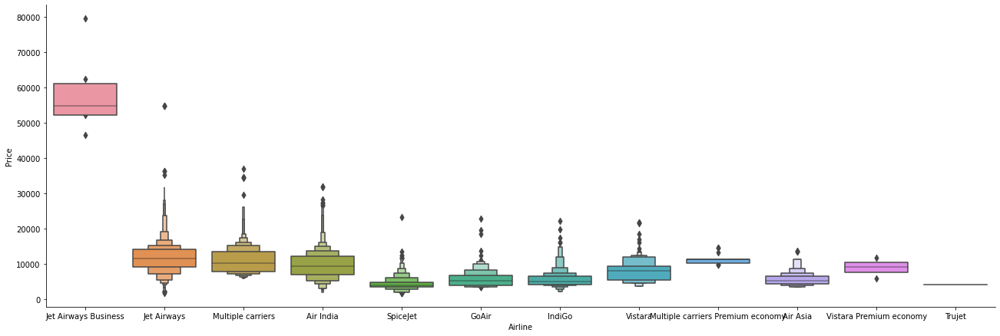

In [14]:
# From graph we can see that Jet Airways Business have the highest Price.
# Apart from the first Airline almost all are having similar median
# Airline vs Price
sns.catplot(y = "Price", x = "Airline", data = df_flight.sort_values("Price", ascending = False), kind="boxen", height = 6, aspect = 3)

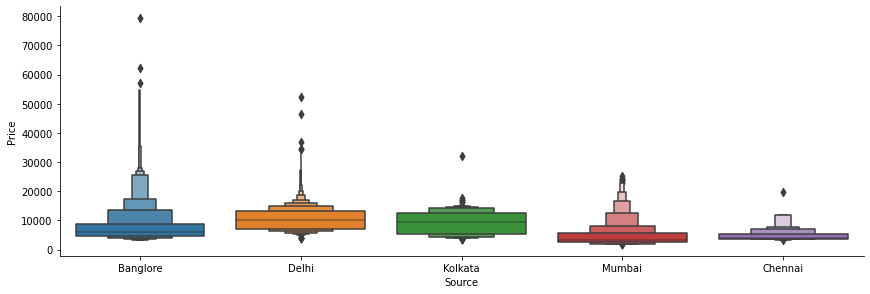

In [15]:
# Source vs Price
sns.catplot(y = "Price", x = "Source", data = df_flight.sort_values("Price", ascending = False), kind="boxen", height = 4, aspect = 3)


In [16]:
# Additional_Info contains almost 80% no_info
# Route and Total_Stops are related to each other
df_flight.drop(["Route", "Additional_Info"], axis = 1, inplace = True)

In [17]:
df_flight["Total_Stops"].value_counts()

1 stop      7056
non-stop    4340
2 stops     1899
3 stops       56
4 stops        2
Name: Total_Stops, dtype: int64

In [18]:
# As this is case of Ordinal Categorical type we perform LabelEncoder
# Here Values are assigned with corresponding keys
df_flight.replace({"non-stop": 0, "1 stop": 1, "2 stops": 2, "3 stops": 3, "4 stops": 4}, inplace = True)

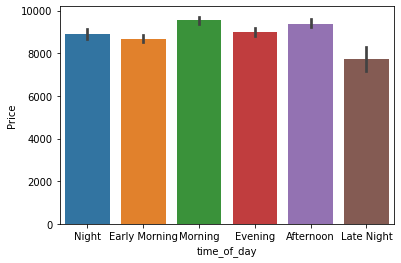

In [19]:
#Lets chcek when the averge price of the flights during entire day
import seaborn as sns
sns.barplot(x="time_of_day",y="Price",data=df_flight)

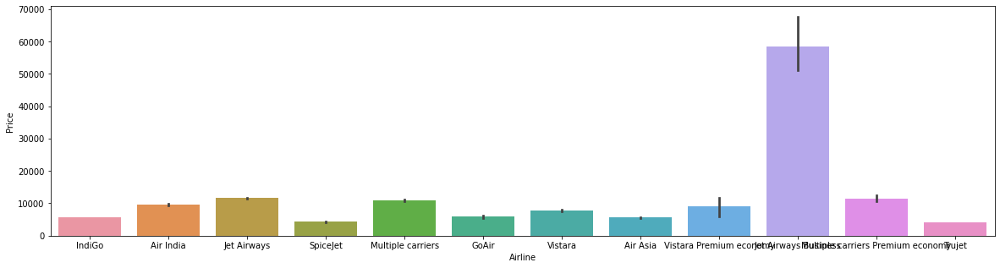

In [20]:
#lets check which airline is expensive based on average price
plt.figure(figsize=(20,5))
sns.barplot(x="Airline",y="Price",data=df_flight)

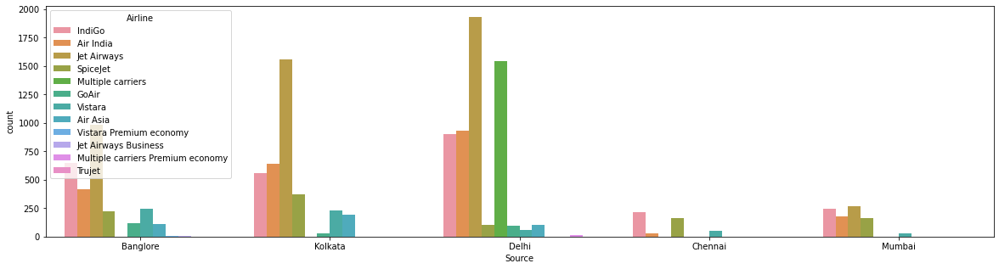

In [21]:
#Lets chcek the most popular flight region wise
plt.figure(figsize=(20,5))
sns.countplot(x="Source",hue="Airline",data=df_flight)

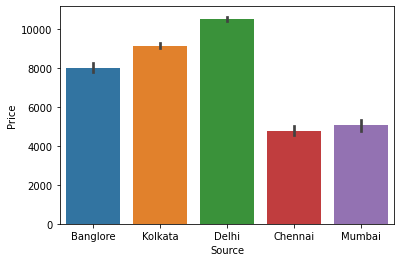

In [22]:

#Lets chcek from which region averge price of the flight was more
sns.barplot(x="Source",y="Price",data=df_flight)

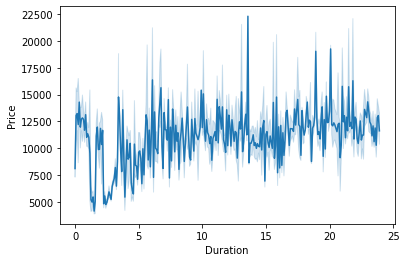

In [23]:
#lets draw a line plot between duration and price
sns.lineplot(x="Duration",y="Price",data=df_flight)
#this picture does not give clear idea about the correlation

In [24]:
df_flight.head()

,Airline,Source,Destination,Duration,Total_Stops,Price,dataset,time_of_day,Journey_month,Journey_day,Dep_hour,Dep_min,Arrival_hour,Arrival_min
0,IndiGo,Banglore,New Delhi,2.833333,0.0,3897.0,train,Night,3,24,22,20,1,10
1,Air India,Kolkata,Banglore,7.416667,2.0,7662.0,train,Early Morning,1,5,5,50,13,15
2,Jet Airways,Delhi,Cochin,19.000000,2.0,13882.0,train,Morning,9,6,9,25,4,25
3,IndiGo,Kolkata,Banglore,5.416667,1.0,6218.0,train,Evening,12,5,18,5,23,30
4,IndiGo,Banglore,New Delhi,4.750000,1.0,13302.0,train,Afternoon,1,3,16,50,21,35


In [25]:
df_flight.Airline.value_counts()

Jet Airways                          4746
IndiGo                               2564
Air India                            2192
Multiple carriers                    1543
SpiceJet                             1026
Vistara                               608
Air Asia                              405
GoAir                                 240
Multiple carriers Premium economy      16
Jet Airways Business                    8
Vistara Premium economy                 5
Trujet                                  1
Name: Airline, dtype: int64

In [26]:
df_flight["Airline"].replace("Jet Airways Business","Jet Airways",inplace=True)
df_flight["Airline"].replace("Multiple carriers Premium economy","Multiple carriers",inplace=True)
df_flight["Airline"].replace("Vistara Premium economy","Vistara",inplace=True)

Same Type of categorical variable has been replaced.

In [27]:
df_flight.Source.value_counts()

Delhi       5682
Kolkata     3581
Banglore    2752
Mumbai       883
Chennai      456
Name: Source, dtype: int64

Values count of source stations.

In [28]:
df_flight.Destination.value_counts()

Cochin       5682
Banglore     3581
Delhi        1582
New Delhi    1170
Hyderabad     883
Kolkata       456
Name: Destination, dtype: int64

Values count of Destinations stations

In [29]:
df_flight.time_of_day.value_counts()

Morning          3415
Early Morning    2955
Afternoon        2425
Night            2126
Evening          2110
Late Night        323
Name: time_of_day, dtype: int64

Value counts of categorical time of day

In [30]:
from sklearn.preprocessing import LabelEncoder
le= LabelEncoder()
df_flight['time_of_day']=le.fit_transform(df_flight['time_of_day'])
df_flight['Destination']=le.fit_transform(df_flight['Destination'])
df_flight['Airline']=le.fit_transform(df_flight['Airline'])
df_flight['Source']=le.fit_transform(df_flight['Source'])

Using LabelEncoding convert categorical value into integer form.

In [31]:
df_flight.head()

,Airline,Source,Destination,Duration,Total_Stops,Price,dataset,time_of_day,Journey_month,Journey_day,Dep_hour,Dep_min,Arrival_hour,Arrival_min
0,3,0,5,2.833333,0.0,3897.0,train,5,3,24,22,20,1,10
1,1,3,0,7.416667,2.0,7662.0,train,1,1,5,5,50,13,15
2,4,2,1,19.000000,2.0,13882.0,train,4,9,6,9,25,4,25
3,3,3,0,5.416667,1.0,6218.0,train,2,12,5,18,5,23,30
4,3,0,5,4.750000,1.0,13302.0,train,0,1,3,16,50,21,35


Now data is ready to train Model

In [32]:
#Lets seprate the train and test from df_flight_final
df_train=df_flight.loc[df_flight["dataset"]=="train"]
df_test=df_flight.loc[df_flight["dataset"]=="test"]

In [33]:
#Lets drop "Price" and "dataset" columns from the test dataset
#Also droping "dataset" columns from the train dataset
df_test.drop(columns=["Price","dataset"],inplace=True)
df_train.drop(columns=["dataset"],inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [34]:
df_train.isnull().sum()

Airline          0
Source           0
Destination      0
Duration         0
Total_Stops      1
Price            0
time_of_day      0
Journey_month    0
Journey_day      0
Dep_hour         0
Dep_min          0
Arrival_hour     0
Arrival_min      0
dtype: int64

As seen aboveb one null value is present in dataset

In [35]:
df_train.dropna(axis=0,inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


Droped particular of row where null value was present

In [36]:
pip install -U dataprep

     |████████████████████████████████| 1.8MB 4.2MB/s 
     |████████████████████████████████| 51kB 4.7MB/s 
     |████████████████████████████████| 849kB 30.8MB/s 
     |████████████████████████████████| 368kB 23.5MB/s 
     |████████████████████████████████| 1.3MB 35.4MB/s 
     |████████████████████████████████| 10.1MB 35.3MB/s 
     |████████████████████████████████| 71kB 7.9MB/s 
     |████████████████████████████████| 81kB 7.7MB/s 
     |████████████████████████████████| 727kB 23.6MB/s 
     |████████████████████████████████| 1.5MB 25.6MB/s 
     |████████████████████████████████| 122kB 36.7MB/s 
     |████████████████████████████████| 296kB 35.3MB/s 
     |████████████████████████████████| 143kB 40.7MB/s 
     |████████████████████████████████| 747kB 28.4MB/s 
     |████████████████████████████████| 51kB 5.3MB/s 
  Created wheel for python-Levenshtein: filename=python_Levenshtein-0.12.2-cp37-cp37m-linux_x86_64.whl size=149828 sha256=14c0bba68f786c309cd8785d89b2933937dbec02f6c6d2

DataPrep Report
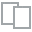
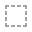
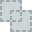
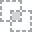
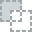
...
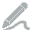
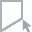
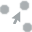
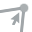
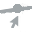

In [38]:
from dataprep.datasets import load_dataset
from dataprep.eda import create_report
create_report(df_train)

In [40]:
from scipy.stats import zscore
z_score=abs(zscore(df_train))
print(df_train.shape)
df_flight_final=df_train.loc[(z_score<3).all(axis=1)]
print(df_flight_final.shape)

(10682, 13)
(10540, 13)


Few outliers are present need to remove

In [41]:
#lets divide the df_train into iput and output
df_x=df_flight_final.drop(columns=["Price"])
y=df_flight_final[["Price"]]

In [42]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(df_x,y)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False)

Try to find out most important Feature from all feature.

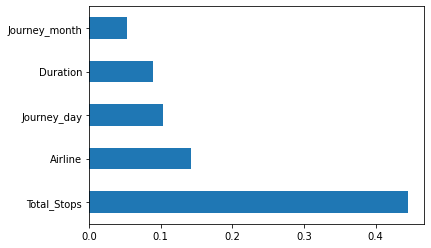

In [44]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=df_x.columns)
feat_importances.nlargest(5).plot(kind='barh')


Displayed there are 5 most important features of dataset.

In [45]:
print(df_x.skew())
print("Total count of numeric features: ",len(df_x.skew()))
print("count of features which are significantly skewed: ",len(df_x.skew().loc[abs(df_x.skew())>0.5]))

Airline          0.138363
Source          -0.437082
Destination      1.266180
Duration         0.838286
Total_Stops      0.227136
time_of_day      0.075321
Journey_month    0.636291
Journey_day      0.353583
Dep_hour         0.107749
Dep_min          0.173743
Arrival_hour    -0.369568
Arrival_min      0.108037
dtype: float64
Total count of numeric features:  12
count of features which are significantly skewed:  3


In [46]:
import numpy as np
for index in df_x.skew().index:
    if df_x.skew().loc[index]>0.5:
        df_x[index]=np.log1p(df_x[index])
    if df_x.skew().loc[index]<-0.5:
        df_x[index]=np.log1p(df_x[index])
print(df_x.skew())
print("Total count of numeric features: ",len(df_x.skew()))
print("count of features which are significantly skewed: ",len(df_x.skew().loc[abs(df_x.skew())>0.5]))

Airline          0.138363
Source          -0.437082
Destination      0.283525
Duration        -0.000447
Total_Stops      0.227136
time_of_day      0.075321
Journey_month   -1.039038
Journey_day      0.353583
Dep_hour         0.107749
Dep_min          0.173743
Arrival_hour    -0.369568
Arrival_min      0.108037
dtype: float64
Total count of numeric features:  12
count of features which are significantly skewed:  1


Consider skewed data.

In [47]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
sc.fit(df_x)
x=sc.transform(df_x)
x=pd.DataFrame(x,columns=df_x.columns)

Scalled datatset in same scale.

In [48]:
#to find random stat which gives maximum r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
def maxr2_score(regr,df_x,y):
    max_r_score=0
    for r_state in range(42,100):
        x_train, x_test, y_train, y_test = train_test_split(df_x, y,random_state = r_state,test_size=0.20)
        regr.fit(x_train,y_train)
        y_pred = regr.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print("r2 score corresponding to ",r_state," is ",r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print("max r2 score corresponding to ",final_r_state," is ",max_r_score)
    return final_r_state

Create a functions to find max r2 score corresponding to random state.

In [49]:
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor()
r_state=maxr2_score(dtr,x,y)

r2 score corresponding to  42  is  0.7461027688758748
r2 score corresponding to  43  is  0.6957102600441993
r2 score corresponding to  44  is  0.7081917425021403
r2 score corresponding to  45  is  0.7182490206767649
r2 score corresponding to  46  is  0.6809019862688663
r2 score corresponding to  47  is  0.7209189963586158
r2 score corresponding to  48  is  0.7102356759058515
r2 score corresponding to  49  is  0.7034662562143141
r2 score corresponding to  50  is  0.7308932405743884
r2 score corresponding to  51  is  0.7113773562384011
r2 score corresponding to  52  is  0.7130576905956953
r2 score corresponding to  53  is  0.6904297360505927
r2 score corresponding to  54  is  0.7242752281363397
r2 score corresponding to  55  is  0.7136697605645441
r2 score corresponding to  56  is  0.7431366948253881
r2 score corresponding to  57  is  0.734556678723093
r2 score corresponding to  58  is  0.7189363106588648
r2 score corresponding to  59  is  0.7040525658235415
r2 score corresponding to  60

Using DecisionTreeRegressor max r2 score corresponding to  42  is  0.74610276887587

In [50]:
#Lets chcek random forest
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings("ignore")
rfr=RandomForestRegressor()
parameters = {"n_estimators":[10,100,500]}
clf = GridSearchCV(rfr, parameters, cv=5,scoring="r2")
clf.fit(x,y)
clf.best_params_

{'n_estimators': 500}

In [51]:
#lets chcek Random forest using n_estimators=500
from sklearn.ensemble import RandomForestRegressor
rfr=RandomForestRegressor(n_estimators=500)
#Lets chcek the cross_val_score for Random Forest Regressor
print("Random Forest Regressor\n\n")
r_state=maxr2_score(dtr,x,y)

Random Forest Regressor


r2 score corresponding to  42  is  0.7464751327908928
r2 score corresponding to  43  is  0.6960759665667784
r2 score corresponding to  44  is  0.7178600536137578
r2 score corresponding to  45  is  0.7128949819656414
r2 score corresponding to  46  is  0.687565956962485
r2 score corresponding to  47  is  0.7219621058473509
r2 score corresponding to  48  is  0.7133568463744426
r2 score corresponding to  49  is  0.7059554454711221
r2 score corresponding to  50  is  0.7292537504770401
r2 score corresponding to  51  is  0.7024320513662321
r2 score corresponding to  52  is  0.6938190170046015
r2 score corresponding to  53  is  0.6841009303613708
r2 score corresponding to  54  is  0.72656452376327
r2 score corresponding to  55  is  0.700334745665868
r2 score corresponding to  56  is  0.740372123090827
r2 score corresponding to  57  is  0.7347593032076566
r2 score corresponding to  58  is  0.7018939269923219
r2 score corresponding to  59  is  0.6968183444350038
r2 scor

Using RandomForest Regressor max r2 score corresponding to  42  is  0.7464751327908928

In [52]:
#Lets chcek KNN regressor
from sklearn.neighbors import KNeighborsRegressor
knr=KNeighborsRegressor()
parameters = {"n_neighbors":range(2,30)}
clf = GridSearchCV(knr, parameters, cv=5,scoring="r2")
clf.fit(x, y)
clf.best_params_

{'n_neighbors': 6}

In [53]:
knr=KNeighborsRegressor(n_neighbors=6)
maxr2_score(knr,x,y)

r2 score corresponding to  42  is  0.7087766505465086
r2 score corresponding to  43  is  0.7006517403275667
r2 score corresponding to  44  is  0.7119385044971354
r2 score corresponding to  45  is  0.6927664153863646
r2 score corresponding to  46  is  0.6758747493180808
r2 score corresponding to  47  is  0.7104317926104601
r2 score corresponding to  48  is  0.7045505066462161
r2 score corresponding to  49  is  0.7163573866358646
r2 score corresponding to  50  is  0.6984448921482856
r2 score corresponding to  51  is  0.6947387463232433
r2 score corresponding to  52  is  0.6934972627797005
r2 score corresponding to  53  is  0.7091601114343598
r2 score corresponding to  54  is  0.707041428843489
r2 score corresponding to  55  is  0.6847356720766469
r2 score corresponding to  56  is  0.6888221097862005
r2 score corresponding to  57  is  0.6960935447377619
r2 score corresponding to  58  is  0.7113887346312104
r2 score corresponding to  59  is  0.696730930214079
r2 score corresponding to  60 

96

Using KNeighborsRegressor max r2 score corresponding to  96  is  0.7253151853873403
96

In [54]:
#lets chcek the SVM
from sklearn.svm import SVR
svr=SVR()
parameters={"kernel":["linear", "poly", "rbf"],"C":[0.001,0.01,0.1,1,10]}
clf = GridSearchCV(svr, parameters, cv=5,scoring="r2")
clf.fit(x,y)
clf.best_params_

{'C': 10, 'kernel': 'linear'}

In [55]:
svr=SVR(C=10,kernel="linear")
maxr2_score(svr,x,y)

r2 score corresponding to  42  is  0.49825179471486736
r2 score corresponding to  43  is  0.4951200329152279
r2 score corresponding to  44  is  0.48771860123863053
r2 score corresponding to  45  is  0.47741904533962487
r2 score corresponding to  46  is  0.4602696926934331
r2 score corresponding to  47  is  0.49339657995169706
r2 score corresponding to  48  is  0.5157773649224018
r2 score corresponding to  49  is  0.48170844835089643
r2 score corresponding to  50  is  0.508125691940132
r2 score corresponding to  51  is  0.4989573682490622
r2 score corresponding to  52  is  0.47291160775857
r2 score corresponding to  53  is  0.5144554625094646
r2 score corresponding to  54  is  0.5158273886844563
r2 score corresponding to  55  is  0.5029667401503367
r2 score corresponding to  56  is  0.4811614362209833
r2 score corresponding to  57  is  0.4797729560347186
r2 score corresponding to  58  is  0.49236632912462774
r2 score corresponding to  59  is  0.4942479734748829
r2 score corresponding to

90

Using SVR max r2 score corresponding to  90  is  0.5225495437948325
90

In [56]:
#random forest and KNN are peforming almost equally good,but KNN is faster so we will choose KNN as our Final model
#knr is model
x_train, x_test, y_train, y_test = train_test_split(x, y,random_state = 77,test_size=0.20)
knr.fit(x_train,y_train)
y_pred=knr.predict(x_test)

In [58]:
print("RMSE is: ",np.sqrt(mean_squared_error(y_test,y_pred)))
print("r2_score is: ",r2_score(y_test,y_pred))

RMSE is:  2224.5144123301748
r2_score is:  0.697944438250645


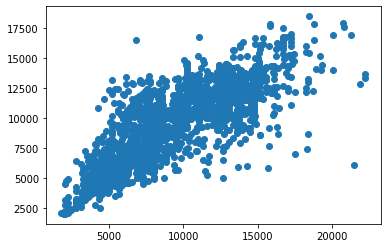

In [59]:
plt.scatter(y_test,y_pred)

As per aboveb displayed test and prediction data are linearly displayed.

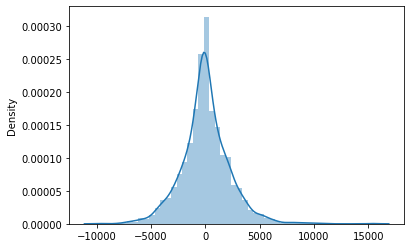

In [62]:
predictions=knr.predict(x_test)
sns.distplot(np.array(y_test)-predictions)

As per aboveb prediction and test are normally distrubuted.

In [63]:
#Lets save the model using joblib and pickle
import joblib
import pickle
joblib.dump(knr, 'knr_Flight.obj')
pickle.dump(knr,open('knr_Flight.pkl','wb'))

Dump the module using both pickle and joblib.